Kakhaev Ivan 0860838  
  
# Introduction
Superresolution is important and difficult task.  
For this project I get 291 training high resolution images and 14 test low resolution images.  
For the model I use RRDN, from the paper "ESRGAN: Enhanced Super-Resolution Generative Adversarial Networks".  
You can find links to original model and changed by me below.  

Data was downloaded from:  
https://drive.google.com/drive/u/0/folders/1H-sIY7zj42Fex1ZjxxSC3PV1pK4Mij6x

Model original:  
https://github.com/idealo/image-super-resolution#installation  
My modified model:  
https://github.com/veax-void/img_super_res  
    
# Methodology
## Pipeline justification
In order to enrich training and validation data I used next augmentations:  
- Rotation (0, 90, 270)  
- Horizontal/Vertical flip

I split data randomly on the train and validation set, 250 images to train and 41 to validation.  
Because model crop low resolution images to size 40x40 all high resolution images that are lower then 160x160 must to be upscaled a little, I used scale factor 1.8. Theoretically tho I must upscale images that less 120x120 (40\*3) but the model has some issues with that and I changed the size of the images that must be upscaled to avoid errors.  
    
Empirically  I found out that next model configuration leads to good results for given data.  
`'C':4, 'D':3, 'G':64, 'G0':64, 'T':10, 'x':3` where:  
T - number of Residual in Residual Dense Blocks (RRDB)  
D - number of Residual Dense Blocks (RDB) insider each RRDB  
C - number of convolutional layers stacked inside a RDB  
G - number of feature maps of each convolutional layers inside the RDBs  
G0 - number of feature maps for convolutions outside of RDBs and of each RBD output  
x - scale  

For all resizes was used bicubic interpolation.

## Reproducing steps
Use `git clone https://github.com/veax-void/img_super_res` to load the code.  
Then download data and put it in to the folder 'data' near 'img_super_res' folder.  

Open 'ISR_runner.ipynb' and follow next steps:  
1) Run 'Data generation' step in this notebook, change folder paths to yours.  
2) For training run: `python train_new_models.py`   
3) For inference use 'Inference step' in this notebook  
    
All weights located at './weights', you can change parameters of the model inside 'train_new_models.py' file if needed.  
  
# Observations
First I tried to use the VSDR model. but I can't get PSNR bigger than 23, and then I switched to the RRDN model that gets me PSNR ~ 32 on the validation set, but on train I still get 22. I spended too much time trying to make VSDR work. Training of super-resolution model is a long process, but I think the most difficult part was to find the right model, it seems like I chose not the best one.
Main thing I leaned from this homework is that deep learning have a lot of different models for particular task and we as computer scientists must know how to find a good one.
  
My final results after 1000 epoches with the best model:  
PSNR = 27.3
  
# Code

In [1]:
#!/usr/bin/python
# -*- coding: utf-8 -*-
import numpy as np
from PIL import Image
import os
from ISR.models import RDN
import numpy as np
from IPython.display import clear_output
from ISR.models import RDN, RRDN
from PIL import Image
import os
import matplotlib.pyplot as plt


## Data generation

In [2]:
# Create folders for new files

os.mkdir('../data/train_hr_img')
os.mkdir('../data/val_hr_img')
os.mkdir('../data/train_lr_img_small')
os.mkdir('../data/val_lr_img_small')


In [3]:
# Random shuffle files to split train/validation

hr_files = [fn for fn in os.listdir('../data/training_hr_images')
            if 'ipynb' not in fn]

np.random.seed(95)
np.random.shuffle(hr_files)


In [24]:
# Generate augmented images

for (i, fn) in enumerate(hr_files):
    clear_output(wait=True)
    print(f'[{i + 1} / {len(hr_files)}]')

    hr_img = Image.open(os.path.join('../data/training_hr_images', fn))
    if hr_img.size[0] < 160 or hr_img.size[1] < 160:
        hr_img = hr_img.resize((int(hr_img.size[0] * 1.8),
                               int(hr_img.size[1] * 1.8)))
    size = hr_img.size

    if i < 250:
        for angle in range(0, 360, 90):
            for flip in range(0, 2):
                for _scale in np.arange(1, 2, 0.35):
                    new_fn = fn[:-4] + '_' + str(angle) + '_' \
                        + str(flip) + '.png'

                    hr_final = hr_img.transpose(flip).rotate(angle,
                            expand=True)
                    lr_final = hr_img.resize((size[0] // 3, size[1]
                            // 3)).transpose(flip).rotate(angle,
                            expand=True)

                    hr_final.save(os.path.join('../data/train_hr_img',
                                  new_fn))
                    lr_final.save(os.path.join('../data/train_lr_img_small'
                                  , new_fn))
    else:
        for angle in range(0, 360, 90):
            for flip in range(0, 2):
                new_fn = fn[:-4] + '_' + str(angle) + '_' + str(flip) \
                    + '.png'

                hr_final = hr_img.transpose(flip).rotate(angle,
                        expand=True)
                lr_final = hr_img.resize((size[0] // 3, size[1]
                        // 3)).transpose(flip).rotate(angle,
                        expand=True)

                hr_final.save(os.path.join('../data/val_hr_img',
                              new_fn))
                lr_final.save(os.path.join('../data/val_lr_img_small',
                              new_fn))


[291/291]


## Training
Run this file to train model:  
`python train_new_models.py`  
you can specify parameters inside the file.


## Inference

In [82]:
# Specify weights you want to use

w_path = \
    './weights/rrdn-C4-D3-G64-G064-T10-x3/2021-01-07_2026/rrdn-C4-D3-G64-G064-T10-x3_best-val_generator_PSNR_Y_epoch015.hdf5'

rdn = RRDN(arch_params={
    'C': 4,
    'D': 3,
    'G': 64,
    'G0': 64,
    'T': 10,
    'x': 3,
    })
rdn.model.load_weights(w_path)


In [83]:
%%time
# Folder for test LR images (from)
test_lr_imgs = '../data/testing_lr_images'

# Folder for test HR images (to)
test_hr_dir = '../data/test_hr_img'

if not os.path.exists(test_hr_dir):
    os.mkdir(test_hr_dir)

fnames = sorted([fn for fn in os.listdir(test_lr_imgs) if not 'ipynb'
                in fn])

for (i, fn) in enumerate(fnames):
    clear_output(wait=True)
    print(f'[{i + 1} / {len(fnames)}] Processing LR image: {fn}')

    img = Image.open(os.path.join(test_lr_imgs, fn))
    lr_img = np.array(img)

    out = rdn.predict(lr_img)

    Image.fromarray(out).save(os.path.join(test_hr_dir, fn))


[14 / 14] Processing LR image: 13.png
CPU times: user 4min 13s, sys: 3.31 s, total: 4min 17s
Wall time: 41.9 s


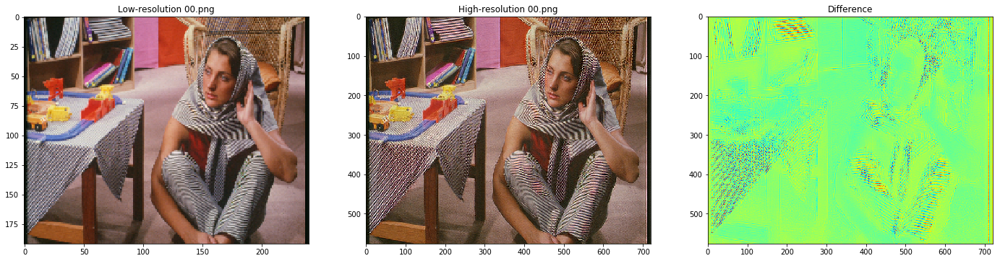

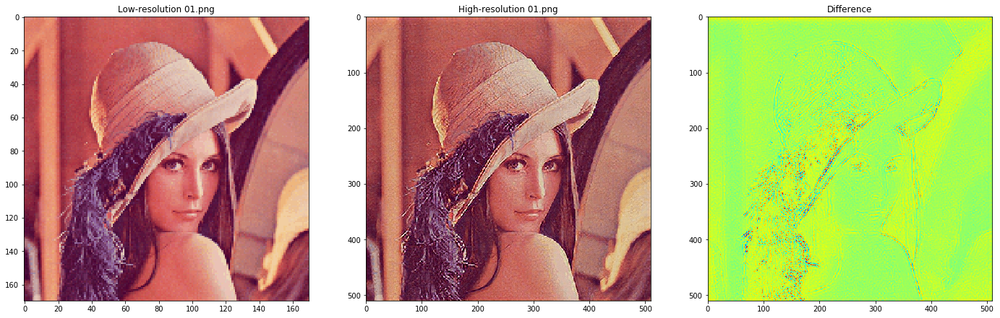

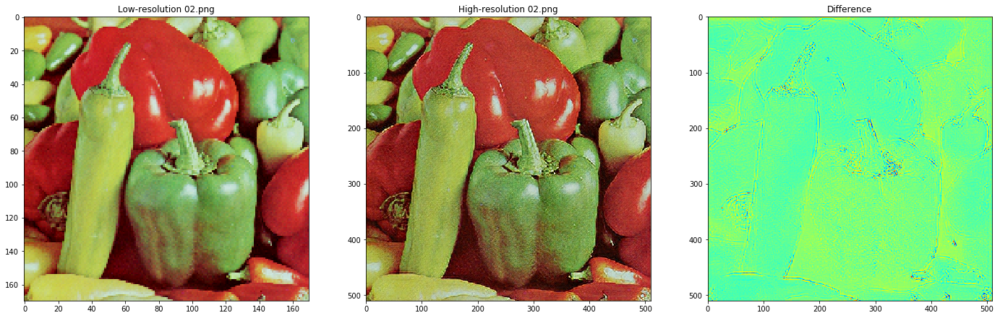

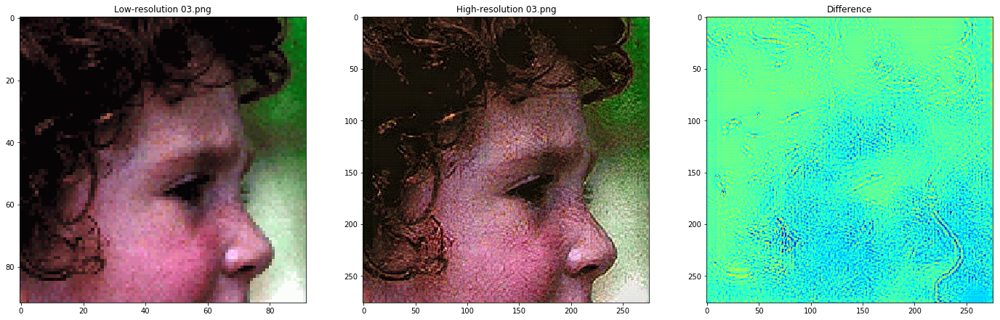

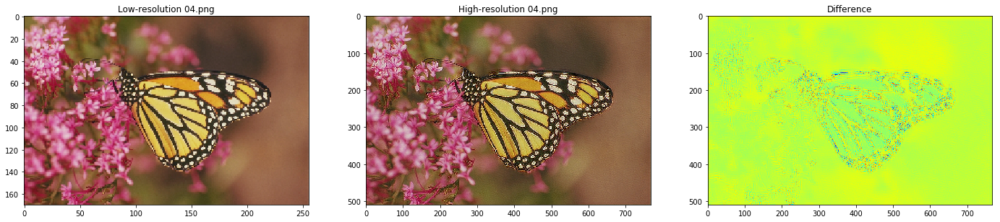

...

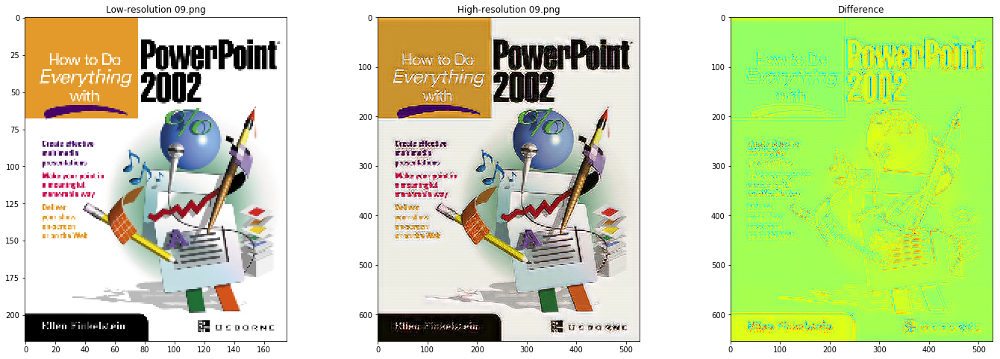

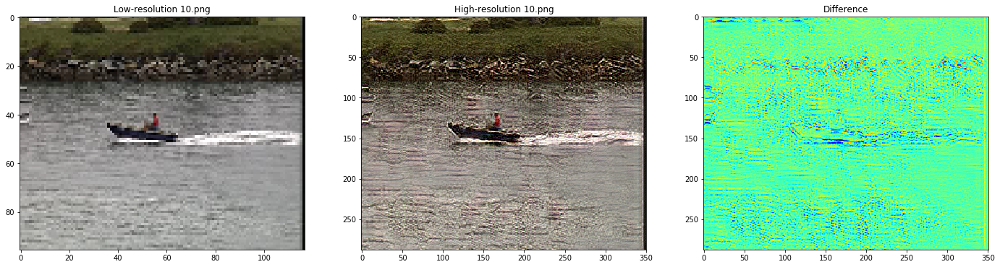

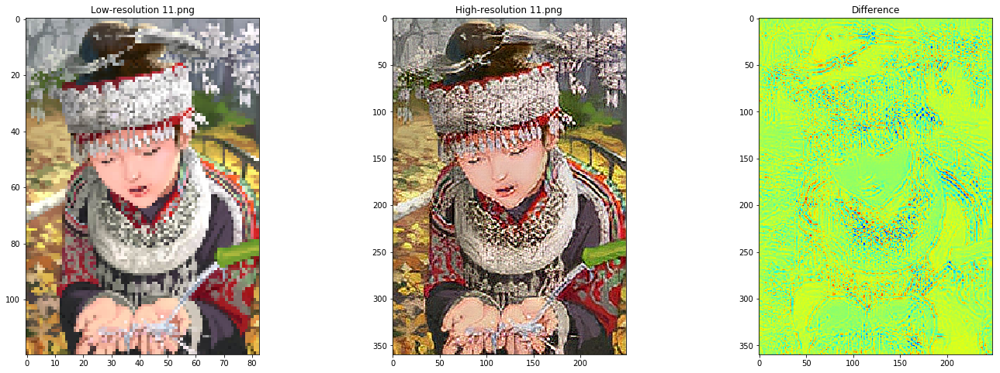

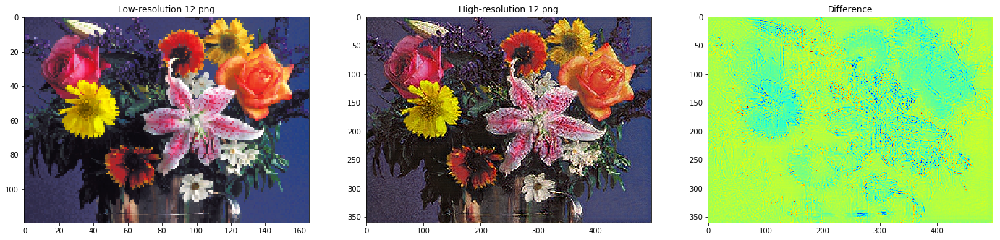

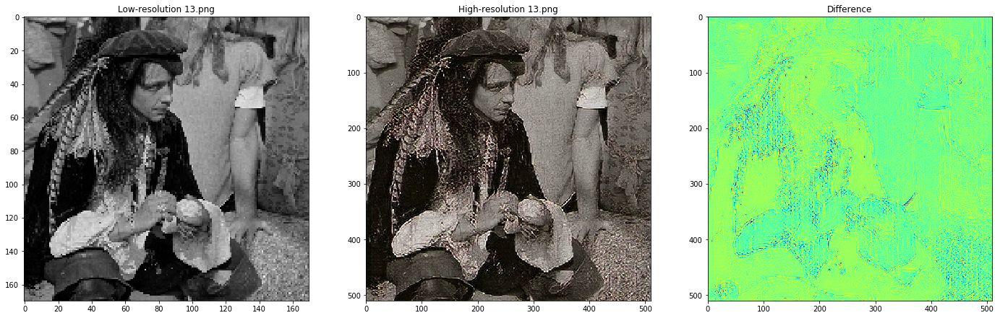

In [84]:
# Plot images
# this images may not reflect the final submission!

fnames = sorted([fn for fn in os.listdir(test_hr_dir) if not 'ipynb'
                in fn])

for fn in fnames:
    hr_img = Image.open(os.path.join(test_hr_dir, fn))
    lr_img = Image.open(os.path.join(test_lr_imgs, fn))
    (fig, ax) = plt.subplots(1, 3, figsize=(8 * 3, 8))

    ax[0].imshow(lr_img)
    ax[1].imshow(hr_img)
    ax[2].imshow(np.array(hr_img, dtype=float)[:, :, 0]
                 - np.array(lr_img.resize(hr_img.size), dtype=float)[:,
                 :, 0], cmap='jet')

    ax[0].set_title(f'Low-resolution {fn}')
    ax[1].set_title(f'High-resolution {fn}')
    ax[2].set_title('Difference')
